# Taller 1
**Integrantes**
- Erich Giusseppe Soto Parada
- Nicolás Klopstock Triana

In [ ]:
!pip install ydata_profiling

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats

from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, roc_auc_score

from sklearn.tree import export_graphviz
import graphviz

from ydata_profiling import ProfileReport

## Entendimiento inicial de datos

In [ ]:
df = pd.read_csv("../data/hotel_bookings_modified.csv")

/tmp/ipykernel_32985/2290306706.py:1: DtypeWarning: Columns (24) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("../data/hotel_bookings_modified.csv")


#### Algunos detalles sobre los datos (se recomienda dejar cerrado)

In [ ]:
df.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                 float64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

In [ ]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'kids'],
      dtype='object')

In [ ]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,kids
0,Resort Hotel,0,342,2015.0,July,27,1,0,0,2,...,NaN,NaN,0.0,Transient,0.0,0.0,0.0,Check-Out,2015-07-01,NaN
1,Resort Hotel,0,737,2015.0,July,27,1,0,0,2,...,NaN,NaN,0.0,Transient,0.0,0.0,0.0,Check-Out,2015-07-01,NaN
2,Resort Hotel,0,7,2015.0,July,27,1,0,1,1,...,NaN,NaN,0.0,Transient,75.0,0.0,0.0,Check-Out,2015-07-02,NaN
3,Resort Hotel,0,13,2015.0,July,27,1,0,1,1,...,304.0,NaN,0.0,Transient,75.0,0.0,0.0,Check-Out,2015-07-02,NaN
4,Resort Hotel,0,14,2015.0,July,27,1,0,2,2,...,240.0,NaN,0.0,Transient,98.0,0.0,1.0,Check-Out,2015-07-03,NaN


##### Hipotesis solo viendo las descripciones de los datos en el diccionario con del top 5.

- adr: Dado que indica el gasto total divisido el numero de dias, si esto incluye tiquetes y demas, se podria extraer los costos, de forma aproximada de la reserva en general por dias, de tal forma de ver si las cancelaciones tienen alguna coorelacion con los costos generales, en cuyo caso, se podrian hacer ofertas u dar otro tipo de incentivos para que los usuarios no cancelen tanto.
- lead_time: Dependiendo de la coorelacion entre hace cuantos dias reservo y si calcelo o no, se puede obtener insigts sobre un threashold el cual no se puede hacer reservas para disminuir las cancelaciones.
- deposit_type: Puede ser que el tipo de deposito influya en las cancelaciones, es decir posiblemente si no hay devoluciones, se cancelara menos, por ende si se cumple la desicion ira por los lados de incentivar un porcentaje mayor de No devolucion.
- previous_cancellations: Con base a las cancelaciones anteriores, puede que suba la probabilidad de riesgo que alguien cancele, por ende se puede hacer un modelo sencillo basado en este y la cantidad de bookings no cancelados para determinar el riesgo de cancelacion.

### Aplicacion de Profile report para ver que esta pasando con cada variable

In [ ]:
profile = ProfileReport(df, title="Reporte de Datos", explorative=True)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 33/33 [00:08<00:00,  4.10it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Resumen de lo encontrado con respecto a que variables tomar, el espacio de variables a utilizar y limpiezas a aplicar.

**Resumen ejecutivo de decisiones (por variable)**

- hotel: el conjunto está dominado por Resort Hotel. Para evitar sesgos, los análisis se harán estratificando por hotel cuando corresponda.

- is_canceled: hay más 0 que 1 (~0.69 a 1). Se mantiene como variable objetivo y se tendrá en cuenta el desbalance en análisis/modelado.

- lead_time: distribución sesgada; se propone transformación logarítmica (log1p) y se pueden probar Box-Cox si se requiere normalidad.

- arrival_date_year: 614 registros con “20016” → corregir a 2016 (error de tipeo).

- arrival_date_month: agosto concentra más reservas. Se mantiene para análisis estacional.

- arrival_date_week_number: distribución más uniforme con atípicos; se mantiene.

- arrival_date_day_of_month: aproximadamente uniforme; se mantiene.

- stays_in_weekend_nights: valores típicos en 0–2; eliminar reservas fuera de 0–2 para concentrar el grueso de la población.

- stays_in_week_nights: corte en 5 noches (eliminar >5), perdiendo ~6.9% de los datos para enfocarse en casos típicos.

- adults: sin observaciones específicas; se mantiene.

- children: fuertemente desbalanceada (casi todo 0); se elimina del análisis.

- babies: fuertemente desbalanceada; se elimina.

- meal: desbalanceada y poco relevante para la toma de decisiones actual; se elimina.

- country: aporta contexto (origen de huéspedes); se mantiene.

- market_segment: útil para ver tasas de cancelación por segmento; se mantiene.

- distribution_channel: útil para ver tasas de cancelación por canal; se mantiene.

- is_repeated_guest: desbalance extremo (~32:1); se elimina.

- previous_cancellations: ~98% nulos; se elimina.

- previous_bookings_not_canceled: ~96% ceros; se elimina.

- reserved_room_type y assigned_room_type: se mantienen y se analizarán disparidades (crear indicador de “mismatch”).

- booking_changes: aunque ~83% nulos, interesa ver relación con cancelaciones; se mantiene (se observa tal cual).

- deposit_type: considerada de las más relevantes (aunque desbalanceada: ~88.9% “No Deposit”); se mantiene para análisis (precaución en modelado).

- agent: no se considera accionable ahora; se elimina.

- company: ~94% ceros; se elimina.

- days_in_waiting_list: ~96% ceros; poco relevante para cancelaciones; se elimina.

- customer_type: desbalanceada, pero se mantiene para revisar asociación con cancelaciones.

- adr: variable clave; eliminar outliers altos y analizar su relación con cancelación. Verificar casos con adr == 0 respecto a is_canceled. Considerar ingreso esperado = adr * (stays_in_week_nights + stays_in_weekend_nights).

- required_car_parking_spaces: desbalance muy grande y no accionable; se elimina.

- total_of_special_requests: poco accionable en este análisis; se elimina.

- reservation_status: redundante con is_canceled y con categoría “No-Show” confusa; eliminar columna y eliminar filas “No-Show” antes de descartarla.

- reservation_status_date: se elimina del conjunto para evitar inconsistencias ligadas a “No-Show”.

- kids: no hay decisión específica en el texto; se elimina.

**Parrafos no ejecutivos con mas detalle**

El conjunto está fuertemente dominado por Resort Hotel, así que cualquier patrón agregado tenderá a reflejar el comportamiento de ese hotel; por eso, cuando se analice algo sensible a mezcla de poblaciones, conviene estratificar por hotel. La variable objetivo is_canceled presenta más 0 que 1 (aprox. 0.69 a 1), lo que implica tener presente el desbalance a la hora de interpretar tasas y correlaciones. lead_time exhibe un sesgo pronunciado; para estabilizar su escala y acercarla a una forma más normal, se aplica una transformación logarítmica (log1p), dejando abierta la puerta a probar Box-Cox si se requiere. En arrival_date_year hay 614 registros con el valor “20016” que se corrige a 2016 por tratarse de un error tipográfico. A nivel estacional, agosto concentra más reservas (arrival_date_month), mientras que arrival_date_week_number se ve más uniforme con algunos atípicos y arrival_date_day_of_month luce prácticamente uniforme; todas se conservan para capturar estacionalidad y calendarios.

En duración de la estancia, se concentra el análisis en los casos típicos: para stays_in_weekend_nights se filtra a 0–2 noches y para stays_in_week_nights se eliminan valores >5 noches (se pierde ~6.9% de los datos), privilegiando representatividad sobre rarezas operativas (las estancias largas existen, pero distorsionan promedios y no son el foco). children y babies se eliminan porque están extremadamente desbalanceadas (casi todo 0) y, sobre todo, porque no resultan variables accionables para “pegarle” a mayor ocupación en el corto plazo: saber que casi nadie viaja con bebés o niños no ofrece una palanca clara para reducir cancelaciones o incrementar ocupación; en cambio, segmentaciones y canales sí habilitan acciones comerciales. Similar razonamiento aplica a meal: aunque pudiera haber señales débiles con cancelación, no se considera clave ahora y se descarta para simplificar. country se conserva para entender procedencias, útil como capa contextual.

market_segment y distribution_channel se mantienen porque permiten identificar segmentos y canales con mayor o menor propensión a cancelar, abriendo la posibilidad de incentivar los de menor cancelación o revisar políticas en los de mayor cancelación. is_repeated_guest se descarta por desbalance extremo (poca variabilidad útil). previous_cancellations y previous_bookings_not_canceled se eliminan por su gran proporción de nulos/cero, que los vuelve poco informativos a nivel agregado. Se analizan conjuntamente reserved_room_type y assigned_room_type introduciendo un indicador de desajuste (cuando lo asignado difiere de lo reservado), con la hipótesis de que un mismatch podría relacionarse con cancelaciones, sin imponer ordinalidad inexistente. booking_changes se conserva (pese a muchos nulos) para evaluar si un mayor número de cambios se asocia a cancelar.

deposit_type es de las variables más relevantes desde el negocio: pese al desbalance (predomina “No Deposit”), vale la pena estudiar sus tasas de cancelación, aunque habría cautela al usarla en modelos. agent no se ve accionable ahora y se elimina; lo mismo company y days_in_waiting_list por su masividad de ceros. customer_type se mantiene para explorar si ciertas categorías muestran mayor propensión a cancelar. En adr, se eliminan outliers altos (para evitar que casos extremos gobiernen los resultados) y se estudia su relación con is_canceled; además se revisa la frecuencia de adr == 0 por estado de cancelación y se construye un ingreso esperado simple como adr * (stays_in_week_nights + stays_in_weekend_nights) para entender la pérdida potencial. required_car_parking_spaces y total_of_special_requests se descartan: ambas están muy desbalanceadas y no ofrecen una palanca clara para reducir cancelaciones. Finalmente, reservation_status se elimina por redundancia con is_canceled y por la categoría “No-Show” que introduce ambigüedad temporal; antes de soltar la columna se remueven las filas “No-Show”. reservation_status_date también se elimina para evitar inconsistencias asociadas a ese estatus. El resto de variables relevantes se conserva, incluyendo kids (no se especificó acción sobre ella).

### Aplicacion de lo mencionado en la anterior seccion.

In [ ]:

def fix_arrival_year(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    df["arrival_date_year"] = pd.to_numeric(df["arrival_date_year"], errors="coerce")
    mask_typo = df["arrival_date_year"] == 20016
    df.loc[mask_typo, "arrival_date_year"] = 2016
    df["arrival_date_year"] = df["arrival_date_year"].astype("Int64")
    return df


def add_lead_time_log(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    df["lead_time"] = pd.to_numeric(df["lead_time"], errors="coerce")
    df["lead_time_log"] = np.log1p(df["lead_time"].clip(lower=0))
    df.drop(columns=["lead_time"])
    return df


def cap_adr_and_remove_outliers(df: pd.DataFrame) -> pd.DataFrame:
    """Elimina outliers altos de adr usando IQR y descarta adr negativos."""
    df = df.copy()
    df["adr"] = pd.to_numeric(df["adr"], errors="coerce")
    q1 = df["adr"].quantile(0.25)
    q3 = df["adr"].quantile(0.75)
    iqr = q3 - q1
    upper = q3 + 1.5 * iqr
    df = df[(df["adr"].notna()) & (df["adr"] >= 0) & (df["adr"] <= upper)]
    return df


def filter_stay_lengths(df: pd.DataFrame) -> pd.DataFrame:
    """Aplicar cortes: weekend 0–2; week <=5."""
    df = df.copy()
    df = df[df["stays_in_weekend_nights"].isin([0, 1, 2])]
    df = df[pd.to_numeric(df["stays_in_week_nights"], errors="coerce") <= 5]
    return df


def drop_no_show_rows(df: pd.DataFrame) -> pd.DataFrame:
    """Eliminar filas con reservation_status == 'No-Show' (antes de soltar la columna)."""
    return df[
        df["reservation_status"].astype(str).str.strip().str.lower()
        != "no-show".lower()
    ]


def build_room_mismatch(df: pd.DataFrame) -> pd.DataFrame:
    """Indicador: reserved != assigned."""
    df = df.copy()
    df["room_mismatch"] = (
        df["reserved_room_type"].astype(str) != df["assigned_room_type"].astype(str)
    ).astype(int)
    return df


def expected_revenue(df: pd.DataFrame) -> pd.DataFrame:
    """Ingreso esperado simple = adr * total noches."""
    df = df.copy()
    total_nights = pd.to_numeric(df["stays_in_week_nights"], errors="coerce").fillna(
        0
    ) + pd.to_numeric(df["stays_in_weekend_nights"], errors="coerce").fillna(0)
    df["expected_revenue"] = (
        pd.to_numeric(df["adr"], errors="coerce").fillna(0) * total_nights
    )
    return df


def apply_column_drops(df: pd.DataFrame) -> pd.DataFrame:
    """Eliminar exactamente las variables indicadas en el texto."""
    drop_cols = [
        "children",
        "babies",
        "meal",
        "is_repeated_guest",
        "previous_cancellations",
        "previous_bookings_not_canceled",
        "agent",
        "company",
        "days_in_waiting_list",
        "required_car_parking_spaces",
        "total_of_special_requests",
        "reservation_status",
        #"reservation_status_date",
        "kids"
    ]
    return df.drop(columns=drop_cols, errors="ignore")


def clean_dataset(df: pd.DataFrame) -> pd.DataFrame:
    """Pipeline de limpieza según las decisiones descritas (sin checks de columnas)."""
    df1 = df.copy()
    df1 = fix_arrival_year(df1)
    df1 = drop_no_show_rows(df1)
    df1 = filter_stay_lengths(df1)
    df1 = cap_adr_and_remove_outliers(df1)
    #df1 = add_lead_time_log(df1)
    df1 = build_room_mismatch(df1)
    df1 = expected_revenue(df1)
    df1 = apply_column_drops(df1)
    df1["deposit_type"] = df1["deposit_type"].replace("Non Refund", "No Refund")

    return df1

df_clean = clean_dataset(df)
df_clean = df_clean.dropna()


print("=== Columnas en df_clean ===")
print(sorted(df_clean.columns.tolist()))
print()

=== Columnas en df_clean ===
['adr', 'adults', 'arrival_date_day_of_month', 'arrival_date_month', 'arrival_date_week_number', 'arrival_date_year', 'assigned_room_type', 'booking_changes', 'country', 'customer_type', 'deposit_type', 'distribution_channel', 'expected_revenue', 'hotel', 'is_canceled', 'lead_time', 'market_segment', 'reservation_status_date', 'reserved_room_type', 'room_mismatch', 'stays_in_week_nights', 'stays_in_weekend_nights']



In [ ]:
df_clean["reservation_status_date"]

0        2015-07-01
1        2015-07-01
2        2015-07-02
3        2015-07-02
4        2015-07-03
            ...    
58890    2016-04-12
58891    2016-01-21
58892    2016-07-28
58893    2016-03-04
58894    2016-05-31
Name: reservation_status_date, Length: 49927, dtype: object

## Estrategia de análisis

Este análisis va a estar compuesto de dos frentes. El primero es descriptivo–exploratorio y se apoya en estadísticos básicos y correlaciones de Spearman entre is\_canceled y las variables que se quieran observar. Elegimos Spearman porque capta asociaciones monótonas sin exigir linealidad, lo que es adecuado para relaciones potencialmente no lineales con cancelaciones. En paralelo, se calculará el rate de cancelación por grupo: para cada categoría de interés (por ejemplo, segmentos, canales, tipos de cliente, tipos de depósito, hotel o el desajuste entre habitación reservada y asignada), se estima la proporción de reservas canceladas dentro de cada categoría, con el fin de identificar de manera directa dónde se concentran las mayores tasas y dónde hay oportunidades de intervención. Para facilitar la lectura y la comunicación, se utilizarán visualizaciones sencillas pero efectivas: diagramas de barras comparando tasas, heatmaps para resumir relaciones entre variables y cancelaciones, y gráficas temporales de cancelaciones para detectar de forma preliminar la presencia de patrones estacionales o tendencias.
El segundo, por su lado, también está dividido en dos enfoques diferentes. El primero es construir un modelo de árboles con el objetivo de obtener, de forma discriminativa y con sustento estadístoc, una lectura rápida de las cinco variables potencialmente más influyentes y siendo una propuesta para identificar posibles clientes que van a cancelar una reserva hechos y tomar acción temprana. De la misma, forma el segundo enfoque también busca  identificar perfiles de alto riesgo de cancelación y proponer estrategias para reducir esas pérdidas; esta vez con un análisis de clustering considerando características y tipo de depósito. Esto nos ayudará a segmentar a los clientes en grupos con comportamientos similares y calcular un acercamiento a un valor de tasa de cancelación por cluster.

## Desarrollo de la estrategia

In [ ]:
df_clean["room_mismatch"]

0        0
1        0
2        1
3        0
4        0
        ..
58890    0
58891    0
58892    0
58893    0
58894    0
Name: room_mismatch, Length: 49927, dtype: int64

=== Balance de clases is_canceled (proporciones) ===
is_canceled
0    0.587618
1    0.412382
Name: proportion, dtype: float64


/tmp/ipykernel_32985/1993856295.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index, y=vc.values, palette="Set2")


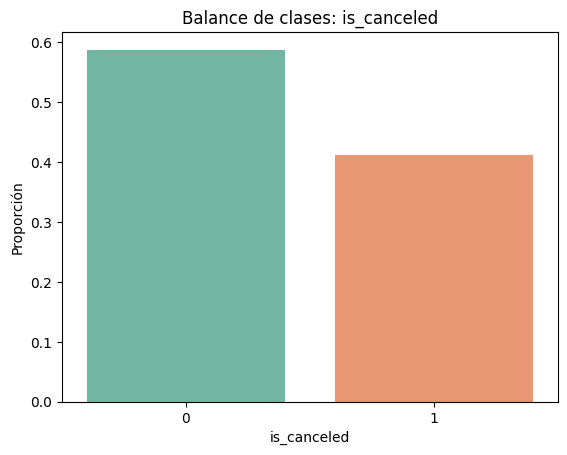


=== Tasa de cancelación por hotel ===
              cancel_rate      n
hotel                           
City Hotel       0.685719  17548
Resort Hotel     0.264245  32379


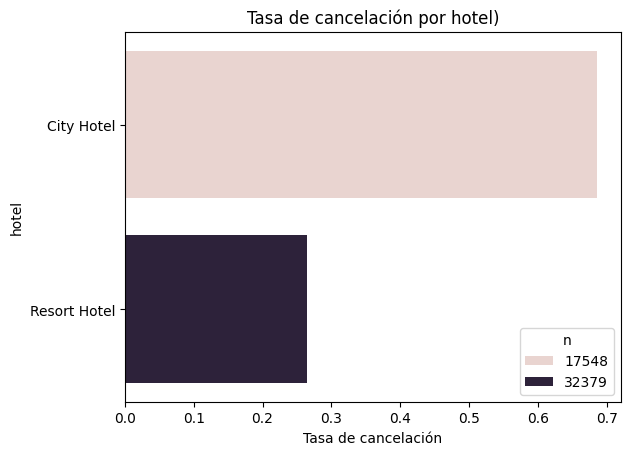


=== Tasa de cancelación por market_segment ===
                cancel_rate      n
market_segment                    
Aviation           1.000000     14
Undefined          1.000000      2
Groups             0.534460   9823
Online TA          0.451568  21339
Offline TA/TO      0.416234  10410
Corporate          0.193767   2214
Complementary      0.184874    238
Direct             0.149652   5887


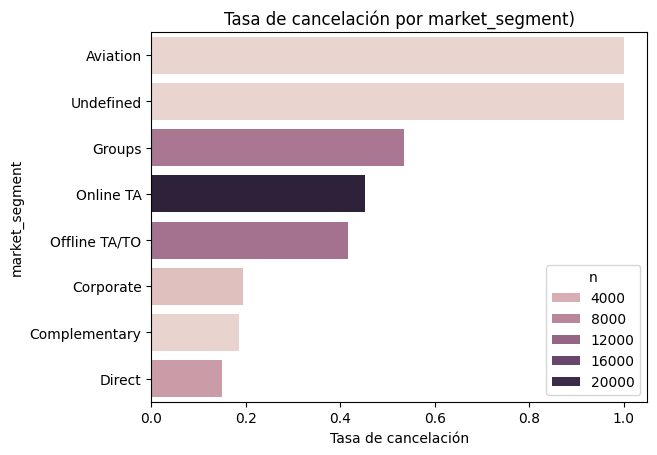


=== Tasa de cancelación por distribution_channel ===
                      cancel_rate      n
distribution_channel                    
GDS                      0.909091     11
Undefined                0.800000      5
TA/TO                    0.466160  39510
Corporate                0.260788   3198
Direct                   0.183673   7203


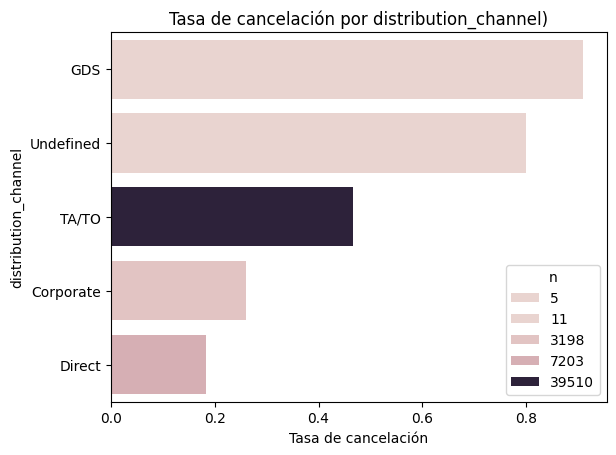


=== Tasa de cancelación por customer_type ===
                 cancel_rate      n
customer_type                      
Transient           0.469929  35882
Transient-Party     0.287341  12031
Contract            0.137514   1738
Group               0.112319    276


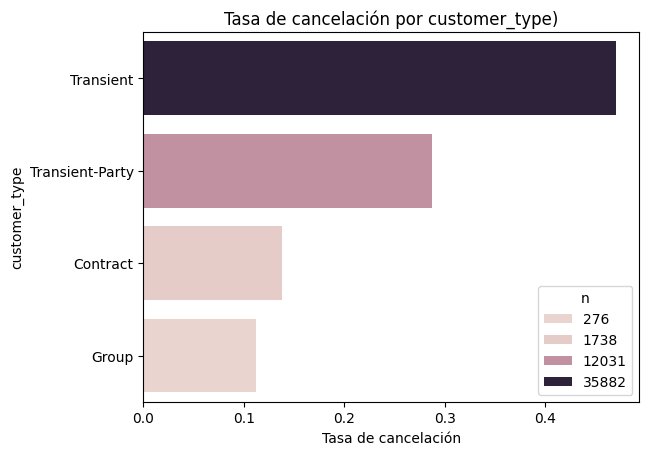


=== Tasa de cancelación por deposit_type ===
              cancel_rate      n
deposit_type                    
No Refund        0.989499   6190
No Deposit       0.331346  43604
Refundable       0.120301    133


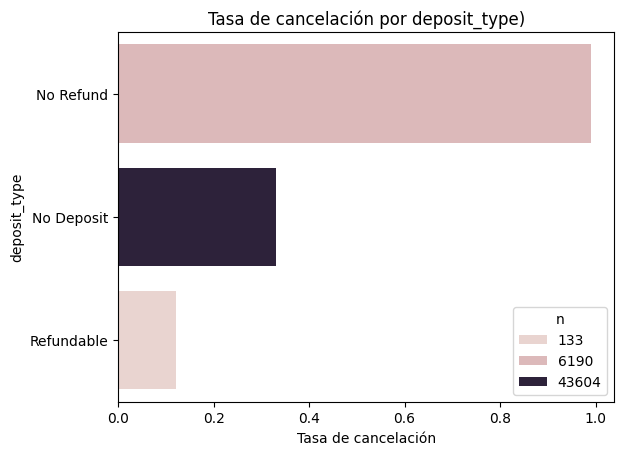


=== Tasa de cancelación por reserved_room_type ===
                    cancel_rate      n
reserved_room_type                    
B                      0.476965    369
A                      0.437844  35081
L                      0.400000      5
D                      0.394949   7563
G                      0.362832   1017
H                      0.336158    354
F                      0.290636   1132
C                      0.288396    586
E                      0.282199   3820


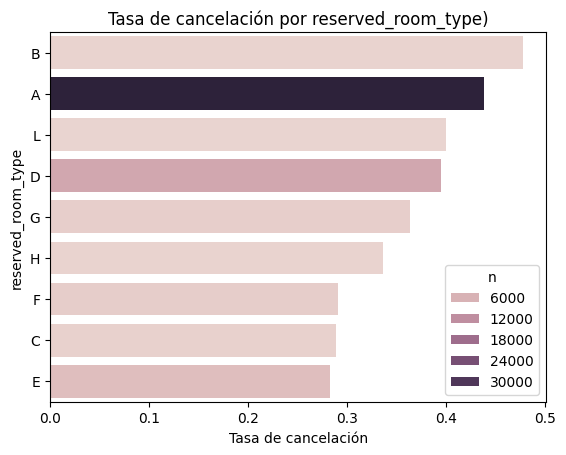


=== Tasa de cancelación por assigned_room_type ===
                    cancel_rate      n
assigned_room_type                    
L                      1.000000      1
A                      0.534402  28065
B                      0.328063    759
G                      0.297211   1255
D                      0.281048  11112
H                      0.276404    445
E                      0.242077   4544
F                      0.204947   1698
C                      0.155979   1731
K                      0.058824     17
I                      0.010000    300


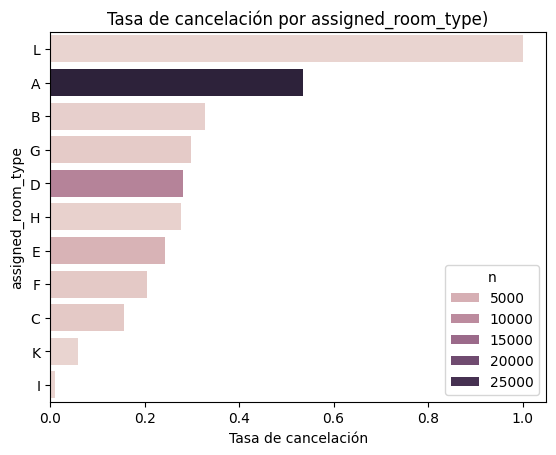


=== Tasa de cancelación por room_mismatch ===
               cancel_rate      n
room_mismatch                    
0                 0.484823  41642
1                 0.048280   8285


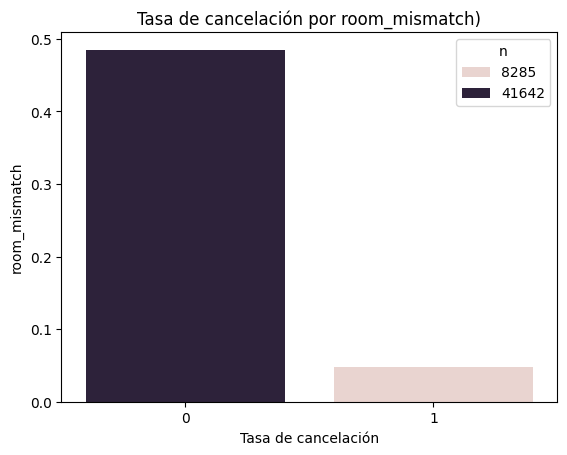


=== Proporción de adr == 0 por is_canceled ===
is_canceled
0    0.026314
1    0.005343
Name: share_adr_zero, dtype: float64

=== Ingreso esperado medio por is_canceled ===
                   mean  median  count
is_canceled                           
0            283.369968   204.0  29338
1            329.868155   262.8  20589

=== Correlaciones (Spearman) con is_canceled (global) ===
lead_time                  0.329158
adr                        0.214511
expected_revenue           0.144598
adults                     0.089458
stays_in_week_nights       0.031144
stays_in_weekend_nights    0.003345
booking_changes           -0.197627
dtype: float64


/tmp/ipykernel_32985/1993856295.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr.values, y=corr.index, palette="viridis")


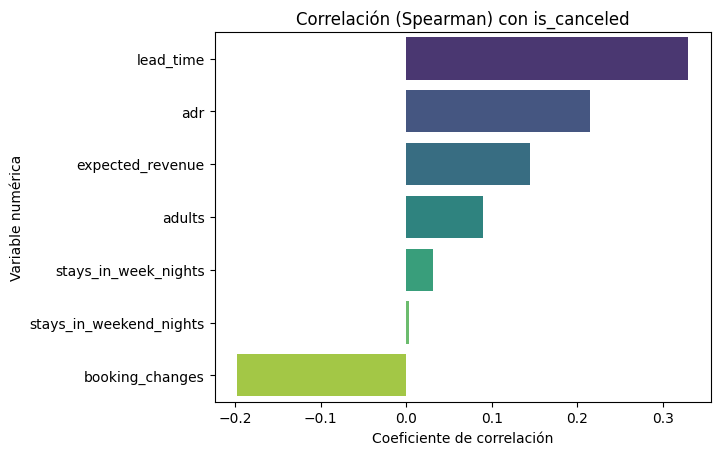


=== Correlaciones por hotel con is_canceled ===
           hotel                 variable  corr_with_is_canceled
0     City Hotel                      adr               0.244634
1     City Hotel                lead_time               0.235030
2     City Hotel         expected_revenue               0.119366
3     City Hotel                   adults               0.066884
4     City Hotel     stays_in_week_nights              -0.002510
5     City Hotel  stays_in_weekend_nights              -0.003346
6     City Hotel          booking_changes              -0.218722
7   Resort Hotel                lead_time               0.310176
8   Resort Hotel         expected_revenue               0.146548
9   Resort Hotel     stays_in_week_nights               0.114271
10  Resort Hotel                   adults               0.104028
11  Resort Hotel  stays_in_weekend_nights               0.098121
12  Resort Hotel                      adr               0.093631
13  Resort Hotel          booking_changes

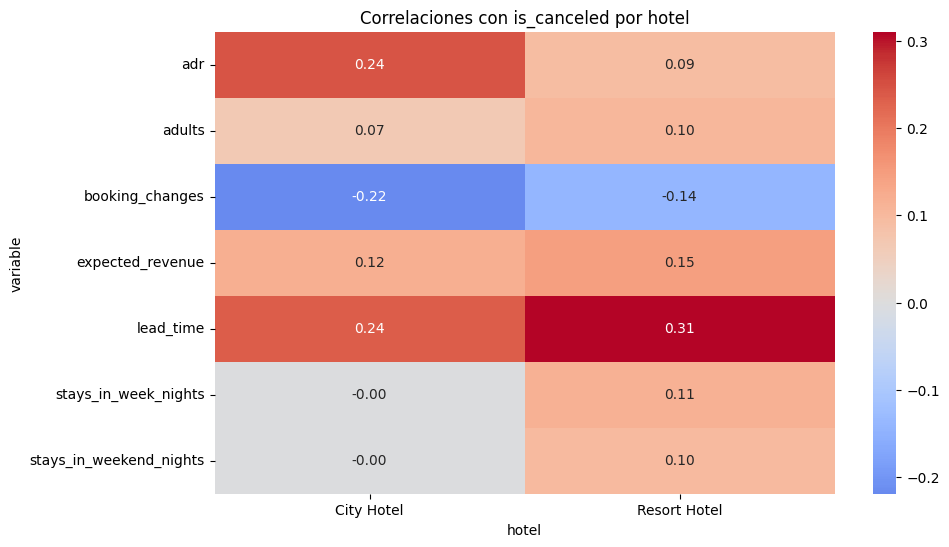

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ===============================
# Funciones de análisis
# ===============================

def class_balance(df: pd.DataFrame) -> pd.Series:
    vc = df['is_canceled'].value_counts(dropna=False)
    return (vc / vc.sum()).rename('proportion')

def cancellation_rate_by(df: pd.DataFrame, col: str) -> pd.DataFrame:
    g = df.groupby(col)['is_canceled'].agg(['mean','count']).rename(columns={'mean':'cancel_rate','count':'n'})
    return g.sort_values('cancel_rate', ascending=False)

def numeric_correlations(df: pd.DataFrame, numeric_cols: list) -> pd.Series:
    """Correlación de spearman con is_canceled (0/1) para numéricas."""
    corr = {}
    y = pd.to_numeric(df['is_canceled'], errors='coerce')
    for c in numeric_cols:
        x = pd.to_numeric(df[c], errors='coerce')
        m = x.notna() & y.notna()
        if m.sum() > 2 and x[m].std(ddof=0) > 0:
            corr[c] = x[m].corr(y[m], method="spearman")
    return pd.Series(corr).sort_values(ascending=False)

def correlations_by_group(df: pd.DataFrame, group_col: str, numeric_cols: list) -> pd.DataFrame:
    """Correlaciones numéricas con is_canceled dentro de cada grupo (p.ej., por hotel)."""
    rows = []
    for gval, sub in df.groupby(group_col):
        s = numeric_correlations(sub, numeric_cols)
        for k, v in s.items():
            rows.append({group_col: gval, 'variable': k, 'corr_with_is_canceled': v})
    return pd.DataFrame(rows).sort_values([group_col,'corr_with_is_canceled'], ascending=[True, False])

# ===============================
# Funciones de visualización
# ===============================

def plot_class_balance(df):
    vc = df['is_canceled'].value_counts(normalize=True)
    sns.barplot(x=vc.index, y=vc.values, palette="Set2")
    plt.title("Balance de clases: is_canceled")
    plt.ylabel("Proporción")
    plt.xlabel("is_canceled")
    plt.show()

def plot_cancellation_rate_by(df, col):
    g = cancellation_rate_by(df, col)

    if col == "room_mismatch":
        sns.barplot(data=g, x=g.index, y='cancel_rate', hue='n', dodge=False)
        plt.title(f"Tasa de cancelación por {col})")
        plt.xlabel("Tasa de cancelación")
        plt.ylabel(col)
        plt.show()

    else:
        sns.barplot(data=g, x='cancel_rate', y=g.index, hue='n', dodge=False)
        plt.title(f"Tasa de cancelación por {col})")
        plt.xlabel("Tasa de cancelación")
        plt.ylabel(col)
        plt.show()

def plot_numeric_correlations(df, numeric_cols):
    corr = numeric_correlations(df, numeric_cols)
    sns.barplot(x=corr.values, y=corr.index, palette="viridis")
    plt.title("Correlación (Spearman) con is_canceled")
    plt.xlabel("Coeficiente de correlación")
    plt.ylabel("Variable numérica")
    plt.show()

def plot_corr_by_group(df, group_col, numeric_cols):
    corr_df = correlations_by_group(df, group_col, numeric_cols)
    plt.figure(figsize=(10,6))
    sns.heatmap(
        corr_df.pivot(index='variable', columns=group_col, values='corr_with_is_canceled'),
        annot=True, fmt=".2f", cmap="coolwarm", center=0
    )
    plt.title(f"Correlaciones con is_canceled por {group_col}")
    plt.show()


print("=== Balance de clases is_canceled (proporciones) ===")
print(class_balance(df_clean))
plot_class_balance(df_clean)
print()

for col in [
    'hotel','market_segment','distribution_channel','customer_type','deposit_type',
    'reserved_room_type','assigned_room_type','room_mismatch'
]:
    print(f"=== Tasa de cancelación por {col} ===")
    print(cancellation_rate_by(df_clean, col))
    plot_cancellation_rate_by(df_clean, col)
    print()

print("=== Proporción de adr == 0 por is_canceled ===")
tmp = df_clean.assign(adr_zero=(df_clean['adr'] == 0).astype(int))
print(tmp.groupby('is_canceled')['adr_zero'].mean().rename('share_adr_zero'))
print()

print("=== Ingreso esperado medio por is_canceled ===")
print(df_clean.groupby('is_canceled')['expected_revenue'].agg(['mean','median','count']))
print()

numeric_candidates = [
    'lead_time','stays_in_weekend_nights','stays_in_week_nights',
    'adults','adr','booking_changes','expected_revenue'
]
print("=== Correlaciones (Spearman) con is_canceled (global) ===")
print(numeric_correlations(df_clean, numeric_candidates))
plot_numeric_correlations(df_clean, numeric_candidates)
print()

print("=== Correlaciones por hotel con is_canceled ===")
corr_by_hotel = correlations_by_group(df_clean, 'hotel', numeric_candidates)
print(corr_by_hotel)
plot_corr_by_group(df_clean, 'hotel', numeric_candidates)
print()


Todos los análisis correspondientes se encuentran detallados en el documento. Esto aplica tanto a lo descrito en esta sección como al resto de los árboles y clústeres, por lo que se recomienda revisar el documento completo.

En cuanto a las variables seleccionadas para el análisis, se decidió incluir todas aquellas consideradas relevantes, las cuales se muestran en la parte superior.

### Tiempo

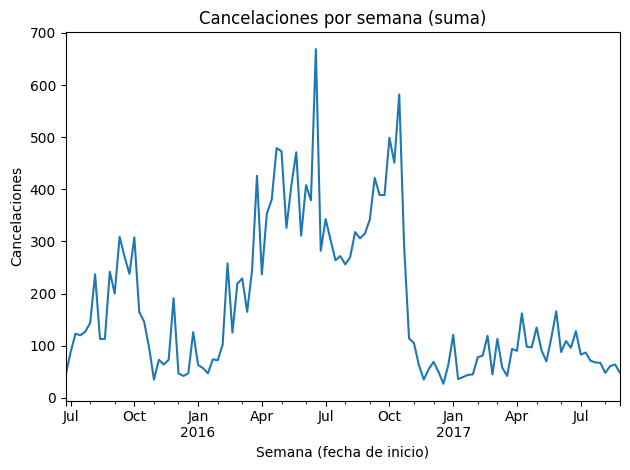

In [ ]:

iso_str = (
    df_clean['arrival_date_year'].astype(int).astype(str) +
    df_clean['arrival_date_week_number'].astype(int).astype(str).str.zfill(2) +
    '1'
)
week_date = pd.to_datetime(iso_str, format='%G%V%u', errors='coerce')
ts_week = (
    pd.DataFrame({'week_start': week_date, 'is_canceled': df_clean['is_canceled'].astype(int)})
    .dropna(subset=['week_start'])
    .groupby('week_start')['is_canceled'].sum()
    .sort_index()
)

plt.figure()
ts_week.plot()
plt.title("Cancelaciones por semana (suma)")
plt.xlabel("Semana (fecha de inicio)")
plt.ylabel("Cancelaciones")
plt.tight_layout()
plt.show()


Esto es simplemente una grafica temporal, se intento hacer prediccion temporal con arimas, pero teniendo en cuenta la variabilidad de las cancelaciones, aunque se hicieron distintos modelos, no se logro uno que diera resultados satisfactorios, tanto asi que, no se incluyo en el notebook. Esto solo para tenerlo en cuenta.

### Árboles

Métricas de test
              precision    recall  f1-score   support

           0     0.8099    0.8671    0.8375      5868
           1     0.7894    0.7101    0.7476      4118

    accuracy                         0.8023      9986
   macro avg     0.7997    0.7886    0.7926      9986
weighted avg     0.8015    0.8023    0.8005      9986

ROC AUC: 0.8760

Top 10 variables más importantes
                         feature  importance
32        deposit_type_No Refund    0.388456
0               hotel_City Hotel    0.222098
53                     lead_time    0.123974
29       customer_type_Transient    0.084630
20      market_segment_Online TA    0.057623
57                           adr    0.045801
43          assigned_room_type_A    0.036006
19  market_segment_Offline TA/TO    0.013480
58               booking_changes    0.011233
34          reserved_room_type_A    0.007323 

=== Reglas del árbol (primeras capas) ===
|--- deposit_type_No Refund <= 0.50
|   |--- hotel_City Hotel <= 0.

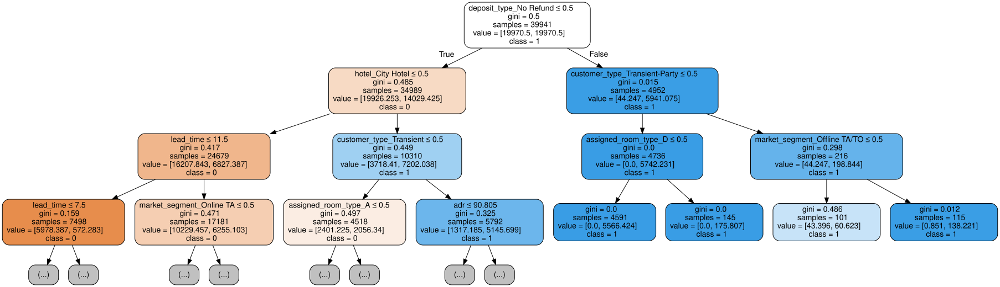

In [ ]:

num_cols = [
    'lead_time','stays_in_weekend_nights','stays_in_week_nights',
    'adults','adr','booking_changes','expected_revenue'
]
cat_cols = [
    'hotel','arrival_date_month','market_segment','distribution_channel',
    'customer_type','deposit_type','reserved_room_type','assigned_room_type'
]

X = df_clean[num_cols + cat_cols]
y = df_clean['is_canceled'].astype(int)

pre = ColumnTransformer([
    ('cat', OneHotEncoder(handle_unknown='ignore'), cat_cols),
    ('num', 'passthrough', num_cols),
])

clf = DecisionTreeClassifier(
    max_depth=6,
    min_samples_leaf=100,
    class_weight='balanced',
    random_state=42
)

pipe = Pipeline([('pre', pre), ('clf', clf)])

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

pipe.fit(X_train, y_train)
y_proba = pipe.predict_proba(X_test)[:, 1]
y_pred = (y_proba >= 0.5).astype(int)

print("Métricas de test")
print(classification_report(y_test, y_pred, digits=4))
print(f"ROC AUC: {roc_auc_score(y_test, y_proba):.4f}\n")

ohe = pipe.named_steps['pre'].named_transformers_['cat']
ohe_features = ohe.get_feature_names_out(cat_cols)
feature_names = np.concatenate([ohe_features, np.array(num_cols)])
importances = pipe.named_steps['clf'].feature_importances_
fi = pd.DataFrame({'feature': feature_names, 'importance': importances}).sort_values('importance', ascending=False)

print("Top 10 variables más importantes")
print(fi.head(10), "\n")


clf = pipe.named_steps['clf']
rules = export_text(clf, feature_names=list(feature_names), max_depth=3)
print("=== Reglas del árbol (primeras capas) ===")
print(rules)
dot_data = export_graphviz(
    clf,
    out_file=None,
    feature_names=list(feature_names),
    class_names=clf.classes_.astype(str),
    filled=True,
    rounded=True,
    special_characters=True,
    max_depth=3
)

graph = graphviz.Source(dot_data)
graph.render("tree")
graph




En conjunto, el dataset tiene una tasa de cancelación del 41% (balance moderado), pero el riesgo no es homogéneo: City Hotel concentra la mayor parte del problema (≈0.69 de cancelación) frente a Resort (≈0.26). El árbol “abre” con deposit_type = No Refund como primer corte: cuando está presente, prácticamente todo se clasifica como cancelado (clase 1) en las ramas profundas. Esto calza con la tasa empírica (≈0.99), pero es contraintuitivo para la operativa (un “no reembolsable” debería reducir la cancelación), lo que sugiere problema de codificación/semántica en esa variable; conviene normalizar “Non Refund/No Refund” en una sola categoría y validar su significado real antes de usarla como driver de negocio o de modelado.

En las ramas donde No Refund = 0 (es decir, sin ese depósito), el árbol usa hotel, lead_time y Online TA: a lead_time bajo (≤ 11.5 días) el riesgo es menor; cuando el lead_time sube y además el canal es Online TA, el riesgo crece, alineado con las tasas por segmento/canal (Online TA ≈ 0.45; TA/TO ≈ 0.47). También aparece customer_type = Transient y adr como criterios: Transient es el tipo más riesgoso (≈0.47) y adr alto eleva la probabilidad, coherente con las correlaciones (Spearman) donde lead_time (≈0.33) es el driver numérico más fuerte, seguido por adr (≈0.21) y expected_revenue (≈0.15). Además, los cancelados tienen mayor ingreso esperado (media ≈330 vs 283), por lo que el impacto económico se concentra en reservas de valor alto.

Ahora bien, ninguna de las correlaciones supera 0.8 (el umbral que propones para considerar “alta”): por tanto, ninguna variable aislada es suficientemente determinante como para “explicar” por sí sola la cancelación; lo que hay son asociaciones moderadas. Esto implica que las interacciones (p. ej., lead_time × canal/segmento × hotel) y reglas no lineales (como el árbol) aportan más que umbrales simples. También hay que tener cuidado con leakage: el árbol utiliza assigned_room_type y, en tu exploratorio, room_mismatch muestra una tasa bajísima de cancelación cuando hay desajuste (≈0.05). Estas señales suelen estar definidas cerca del check-in o post-asignación, y pueden inflar artificialmente el desempeño si se usan para predecir cancelación al momento de la reserva. Mi recomendación es excluir esas columnas en modelos “early warning”.

En síntesis: la historia operativa (sin confiar ciegamente en “No Refund”) es más riesgo en City Hotel, OTAs, clientes Transient, lead_time largo y ADR alto. Dado que no hay correlaciones altas (≥0.8), el fenómeno es multifactorial; conviene modelar con árboles/boosting y validación robusta, controlar leakage, y accionar con reconfirmaciones y políticas diferenciadas (p. ej., umbrales de intervención más agresivos para reservas caras y de largo anticipo en OTAs).

### Clústers

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [ ]:
num_cols = [
    'lead_time','stays_in_weekend_nights','stays_in_week_nights',
    'adults','adr','booking_changes','expected_revenue'
]
cat_cols = [
    'hotel','arrival_date_month','market_segment','distribution_channel',
    'customer_type','deposit_type','reserved_room_type','assigned_room_type'
]

X = df_clean[num_cols + cat_cols]
y = df_clean['is_canceled'].astype(int)

pre = ColumnTransformer([
    ('cat', OneHotEncoder(handle_unknown='ignore'), cat_cols),
    ('num', 'passthrough', num_cols),
])

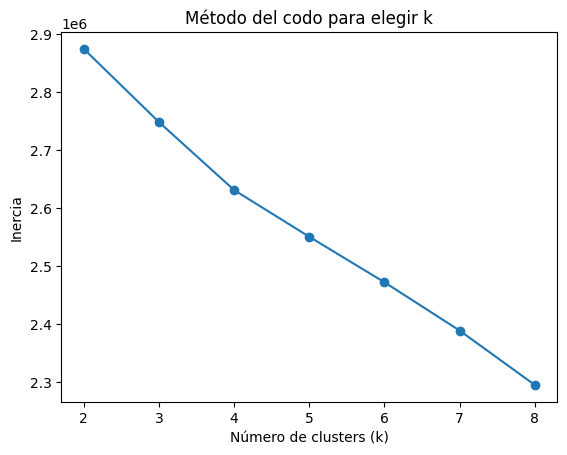

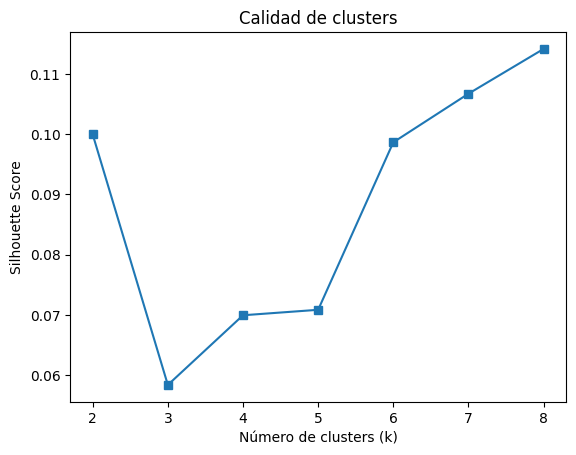

In [ ]:
pipe = Pipeline([
    ('pre', pre),
    ('scaler', StandardScaler(with_mean=False))
])

X_scaled = pipe.fit_transform(X)

inertias = []
sil_scores = []
K = range(2, 9)
for k in K:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(X_scaled)
    inertias.append(km.inertia_)
    sil_scores.append(silhouette_score(X_scaled, labels))

plt.plot(K, inertias, marker="o")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Inercia")
plt.title("Método del codo para elegir k")
plt.show()

plt.plot(K, sil_scores, marker="s")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Calidad de clusters")
plt.show()

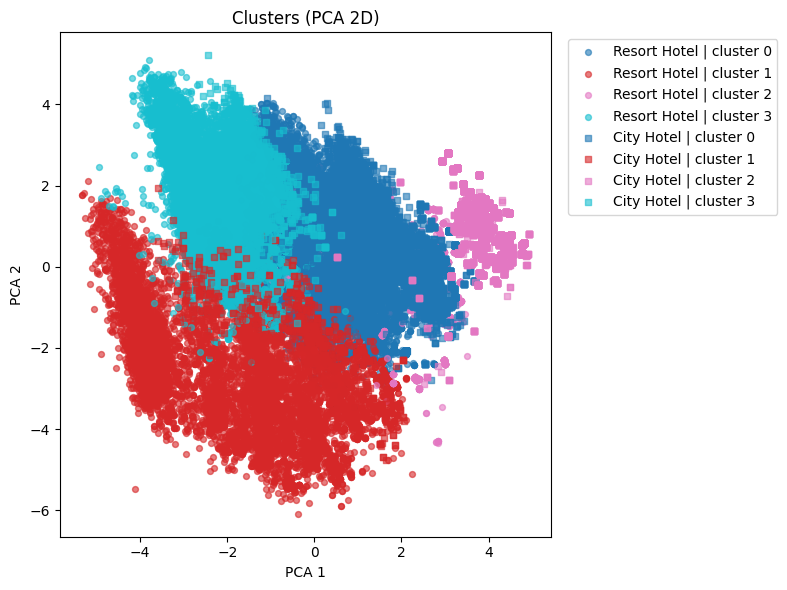

In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

best_k = 4
kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(X_scaled)

df_plot = df_clean.copy()
df_plot["cluster"] = cluster_labels

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)
df_plot["pca1"] = X_pca[:, 0]
df_plot["pca2"] = X_pca[:, 1]

import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8, 6))

cluster_ids = np.sort(df_plot["cluster"].unique())
colors = plt.cm.tab10(np.linspace(0, 1, len(cluster_ids)))
color_map = {cid: colors[i] for i, cid in enumerate(cluster_ids)}

hotel_types = df_plot["hotel"].astype(str).unique()
markers = ["o", "s", "^", "D", "P", "X", "*", "v"]
marker_map = {h: markers[i % len(markers)] for i, h in enumerate(hotel_types)}

for h in hotel_types:
    for cid in cluster_ids:
        sub = df_plot[(df_plot["hotel"].astype(str) == h) & (df_plot["cluster"] == cid)]
        if sub.empty:
            continue
        plt.scatter(
            sub["pca1"], sub["pca2"],
            c=[color_map[cid]],
            marker=marker_map[h],
            alpha=0.6, s=18,
            label=f"{h} | cluster {cid}"
        )

plt.title("Clusters (PCA 2D)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")

handles, labels = plt.gca().get_legend_handles_labels()
uniq = dict(zip(labels, handles))
plt.legend(uniq.values(), uniq.keys(), bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
plt.tight_layout()
plt.show()


In [ ]:
df_plot.groupby("cluster")["is_canceled"].mean()

,is_canceled
cluster,
0,0.380730
1,0.158585
2,0.990875
3,0.382641


In [ ]:
df_plot.groupby("cluster")[num_cols].mean()

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,adr,booking_changes,expected_revenue
cluster,,,,,,,
0,92.732891,0.907184,2.383783,1.951891,82.737978,0.208270,276.273961
1,54.733760,0.665447,2.056115,1.839992,79.135383,0.404493,240.052917
2,207.291185,0.660909,2.176634,1.906469,86.618340,0.014013,247.282138
3,88.824687,1.108380,2.907582,2.131054,110.181255,0.225921,443.683969


In [ ]:
for col in cat_cols:
    print(f"=== {col} ===")
    print(
        df_plot.groupby("cluster")[col]
          .value_counts(normalize=True)  # proporción
          .rename("proportion")
          .reset_index()
          .pivot(index="cluster", columns=col, values="proportion")
          .round(2)
    )
    print("\n")

=== hotel ===
hotel    City Hotel  Resort Hotel
cluster                          
0              0.43          0.57
1              0.10          0.90
2              0.75          0.25
3              0.19          0.81


=== arrival_date_month ===
arrival_date_month  April  August  December  February  January  July  June  \
cluster                                                                      
0                    0.08    0.13      0.06      0.06     0.05  0.09  0.07   
1                    0.08    0.09      0.06      0.10     0.09  0.07  0.06   
2                    0.13    0.04      0.04      0.05     0.01  0.05  0.15   
3                    0.12    0.11      0.05      0.06     0.04  0.12  0.09   

arrival_date_month  March   May  November  October  September  
cluster                                                        
0                    0.07  0.09      0.06     0.11       0.13  
1                    0.10  0.07      0.07     0.13       0.08  
2                    0.07  0

El clúster separado (clúster 2 en la gráfica) resulta particularmente crítico porque muestra una tasa promedio de cancelación de 0.99, es decir, casi todas sus reservas terminan canceladas.

Este clúster se caracteriza por un lead time extremadamente alto (207.39 días en promedio antes de la fecha de llegada), combinado con un ADR inferior al promedio (86.61), lo que muestra que son reservas hechas con muchísima anticipación y a tarifas relativamente bajas. El número de cambios de reserva es prácticamente nulo (0.01 en promedio), lo que refuerza la idea de que no existe un proceso de ajuste o replanificación en este grupo, sino cancelaciones directas. Aproximadamente un 75\% de estas reservas corresponden a hoteles de ciudad y un 25\% a resorts. Este clúster también se distingue por su uso predominante del segmento de mercado “Offline TA/TO”, con un canal de distribución TA/TO en el 92\% de los casos. El tipo de cliente registrado es casi siempre Transient. En cuanto a la política de depósitos, el patrón es curioso: el 100\% de estas reservas están bajo la categoría “No Refund”, lo cual contrasta con su altísima tasa de cancelación (\textit{¿por qué cancelaría si no se le devuelve ningún dinero?}). Finalmente, el comportamiento respecto a las habitaciones es muy homogéneo: el 97\% de los casos se reservó y fue asignada la habitación tipo A, lo que sugiere que la oferta de este tipo de habitación, en combinación con las condiciones de depósito, podría estar relacionada con la propensión extrema a la cancelación.

En contraste, los otros tres clústers presentan tasas de cancelación más bajas y comportamientos más heterogéneos. Entre ellos, destaca el clúster 1, cuya tasa de cancelación es apenas de 0.15, mostrando así un grupo de huéspedes con alta probabilidad de llevar a cabo su reserva. Los clientes en este clúster reservan con un lead time promedio de alrededor de mes y medio antes de la llegada; se concentran fuertemente en resorts (90\%), y muestra un peso importante de Online TA (56\%) con canal de distribución casi exclusivo en TA/TO (0.99). El tipo de cliente vuelve a ser Transient, y en todos los casos el depósito es No Deposit (1.0). A diferencia del clúster 2, aquí no existe una preferencia marcada por un tipo de habitación, ya que la asignación se distribuye de forma casi equitativa entre las distintas categorías.

Realmente se pueden ver las condiciones de ventas opuestas entre ambos gran clústers. Por un lado se puede que que el hecho de "No Deposit" o "No Refunds" no evita cancelaciones.
Un cambio signficativo puede ser empujar más el uso de Online TA en lugar del offline. En este último suele haber menos control directo con el cliente, menor comunicación clara.
El hecho de reservar con más o menos 7 meses de antelación implica "reservas especulativas". Se podrían introducir condiciones específicas para reservas con \textit{lead time} muy alto; algún tipo de precios cambiants, penalidades sueves o beneficios adicionales para los que efectivamente mantengan la reserva.

### Recomendaciones

Con base en los resultados, lo primero es investigar a fondo qué está ocurriendo en City Hotel, donde la cancelación ronda el 69%. Vale la pena explorar causas como calificaciones, accesibilidad u otras características operativas que puedan estar elevando el riesgo. En cuanto al deposit_type, se observa un patrón contraintuitivo: cuando es “No Refund”, la mayoría de las personas termina cancelando. Esto puede sugerir que conviene probar políticas más flexibles (por ejemplo, permitir cancelaciones con reembolso en ciertos casos) y evaluar su impacto con un experimento controlado: tomar un subconjunto de habitaciones, implementar la nueva estrategia y comparar la tasa de cancelación respecto de la estrategia actual mediante una prueba de Wilcoxon (reservas “normales” vs. la alternativa con reembolso). Al mismo tiempo, esta conducta anómala podría indicar problemas en los datos (definición o registro de la variable), por lo que se aconseja auditar su semántica.

Aunque la correlación de Pearson con lead_time es baja, el modelo de árboles la usa como una de las variables más importantes. Por ello, una palanca plausible es reducir el horizonte de reserva para acotar el lead_time; en particular, el árbol sugiere un corte alrededor de 11.5 días, por lo que se podría limitar o desincentivar reservas muy por encima de ese umbral y monitorear si con ello descienden las cancelaciones. Respecto al market_segment, especialmente Online TA, parece que las reservas de plataformas online cancelan más; aquí se recomienda diseñar incentivos (promociones, beneficios de permanencia, reconfirmaciones) para reducir la cancelación en esos canales y, en paralelo, potenciar canales alternativos como Direct, que muestran un desempeño claramente más sano.

Sobre adr, fijar un umbral operativo es más complejo: pese a ser de las variables con correlación más alta junto con lead_time, el nivel sigue siendo bajo (muy lejos de 0.8), por lo que no hay evidencia suficiente para establecer un corte nítido que separe con claridad clases positiva y negativa. En room_mismatch no se observa un patrón que amerite preocupación inmediata; el comportamiento parece incluso opuesto al esperado, por lo que su prioridad de intervención es baja. Finalmente, al mirar tipos de habitación, las categorías A y D destacan por volumen y por su proporción de cancelaciones relativamente alta; conviene levantar información cualitativa (encuestas, escucha en otros canales) para entender si hay temas de precio, recomendaciones u otros factores que estén impulsando ese resultado. En suma: actuar sobre City Hotel, revisar “No Refund”, acotar lead_time, gestionar mejor OTAs e incentivar Direct, y complementar con evidencia cualitativa—todo ello recordando que las correlaciones no superan 0.8, de modo que ninguna variable por sí sola permite determinar con certeza el resultado.